# Lab 9 

Importowanie bibliotek:

In [1]:
from PIL import Image, ImageOps, ImageFont, ImageDraw
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import os

## 1. Analizator Obrazów

In [2]:
def preprocess_img(img,extraValue = None):
    img_gray = img.convert("L")
    img_inverted = ImageOps.invert(img_gray)
    transformed = np.abs(np.array(img_inverted) - extraValue) if extraValue else np.array(img_inverted)
    return img, np.swapaxes(transformed, 0, 1)


In [3]:
def show_image(img,indexes,title,swapaxes = True):
    if swapaxes:
        img = np.swapaxes(img, 0, 1)
    ax = plt.subplot(*indexes)
    plt.xticks([])
    plt.yticks([])
    ax.imshow(img, cmap='gray')
    ax.set_title(title)

In [4]:
def find_pattern(dft,pattern_proccessed,original,pattern_size,min_value=0.5):
    img_width,img_height = original.size

    C = np.real(np.fft.ifft2(np.multiply(dft, np.fft.fft2(np.rot90(pattern_proccessed, 2), s=(img_width, img_height)))))
    C_min = min_value * np.max(C)

    pattern_width, pattern_height = pattern_size

    original_accessor = original.load()
    counter = 0
    for x,y in np.argwhere(C > C_min):
        for w in range(pattern_width):
            for h in range(pattern_height):
                original_accessor[x-w, y-h] = (255,0,0)
        counter += 1

    return counter


### Obraz school.jpg

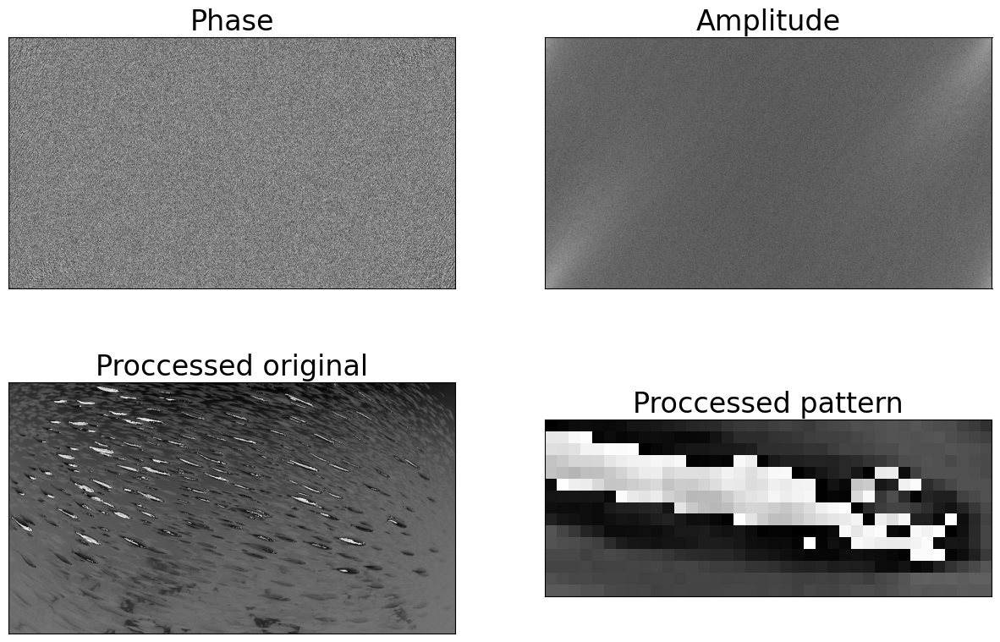

In [6]:
img = Image.open("school.jpg")
original,original_proccessed = preprocess_img(img,extraValue=120)
img = Image.open("fish1.png")
pattern,pattern_proccessed = preprocess_img(img,extraValue=120)

dft = np.fft.fft2(original_proccessed)

phase = np.angle(dft)
amplitude = np.log(np.abs(dft))

plt.figure(figsize=(15,15))
plt.rcParams.update({'font.size': 20})
show_image(phase,(3,2,1),"Phase")
show_image(amplitude,(3,2,2),"Amplitude")
show_image(original_proccessed,(3,2,3),"Proccessed original")
show_image(pattern_proccessed,(3,2,4),"Proccessed pattern")
occurences = find_pattern(dft,pattern_proccessed,original,pattern.size,min_value=0.7)

plt.show()


Occurences: 3739


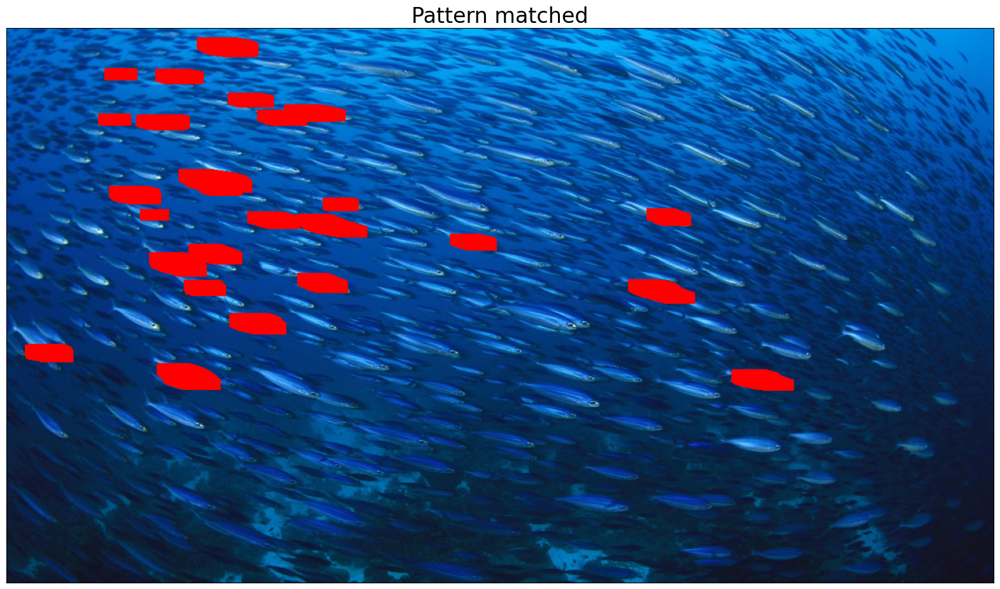

In [7]:
print(f"Occurences: {occurences}")
plt.figure(figsize=(20,20))

show_image(original,(1,1,1),"Pattern matched",False)

plt.show()


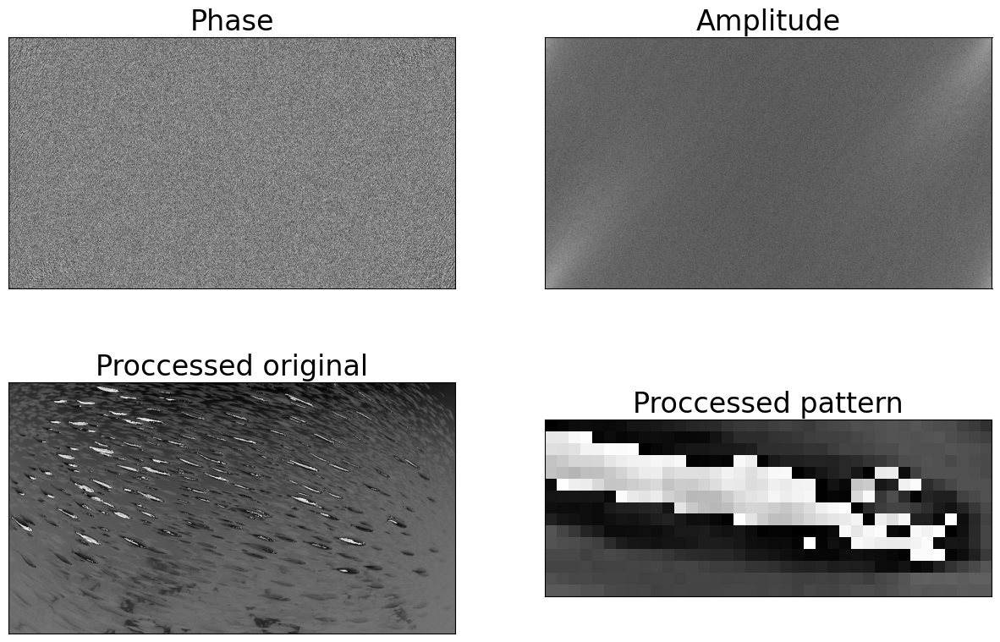

In [8]:
img = Image.open("school.jpg")
original,original_proccessed = preprocess_img(img,extraValue=120)
img = Image.open("fish1.png")
pattern,pattern_proccessed = preprocess_img(img,extraValue=120)

dft = np.fft.fft2(original_proccessed)

phase = np.angle(dft)
amplitude = np.log(np.abs(dft))

plt.figure(figsize=(15,15))
plt.rcParams.update({'font.size': 20})
show_image(phase,(3,2,1),"Phase")
show_image(amplitude,(3,2,2),"Amplitude")
show_image(original_proccessed,(3,2,3),"Proccessed original")
show_image(pattern_proccessed,(3,2,4),"Proccessed pattern")
occurences = find_pattern(dft,pattern_proccessed,original,pattern.size,min_value=0.6)

plt.show()

Occurences: 10917


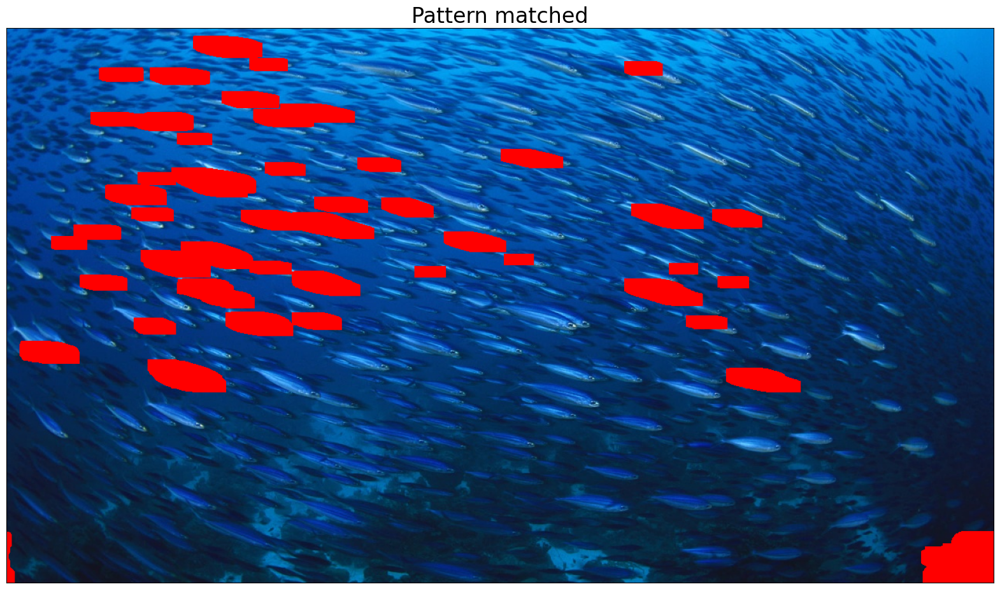

In [9]:
print(f"Occurences: {occurences}")
plt.figure(figsize=(20,20))

show_image(original,(1,1,1),"Pattern matched",False)

plt.show()

### Obraz galia.png

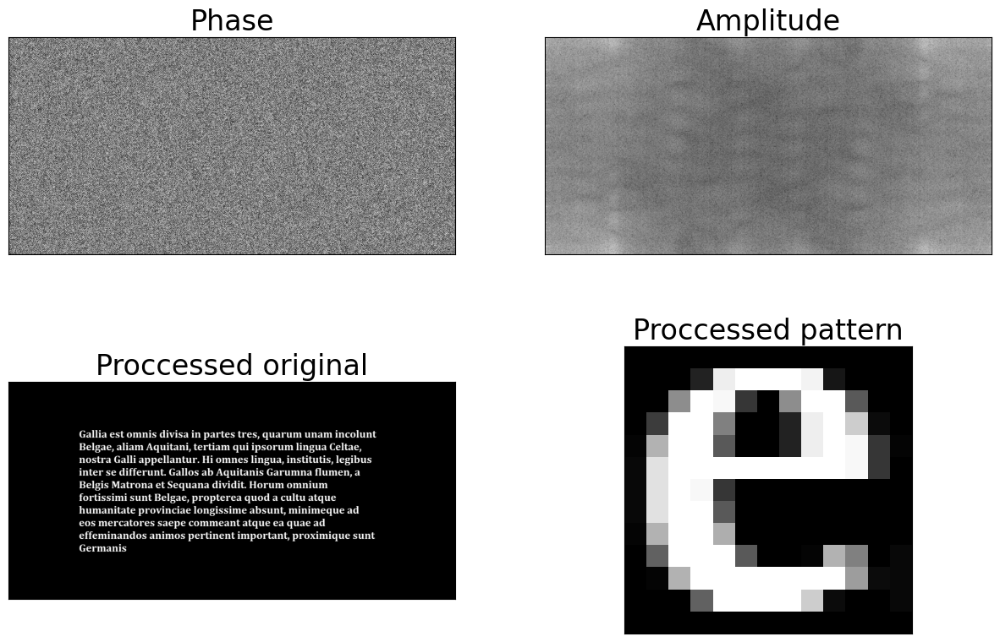

In [10]:
img = Image.open("galia.png")
original,original_proccessed = preprocess_img(img)
img = Image.open("galia_e.png")
pattern,pattern_proccessed = preprocess_img(img)

dft = np.fft.fft2(original_proccessed)

phase = np.angle(dft)
amplitude = np.log(np.abs(dft))

plt.figure(figsize=(15,15))
plt.rcParams.update({'font.size': 20})
show_image(phase,(3,2,1),"Phase")
show_image(amplitude,(3,2,2),"Amplitude")
show_image(original_proccessed,(3,2,3),"Proccessed original")
show_image(pattern_proccessed,(3,2,4),"Proccessed pattern")
occurences = find_pattern(dft,pattern_proccessed,original,pattern.size,min_value=0.9)

plt.show()

Occurences: 43


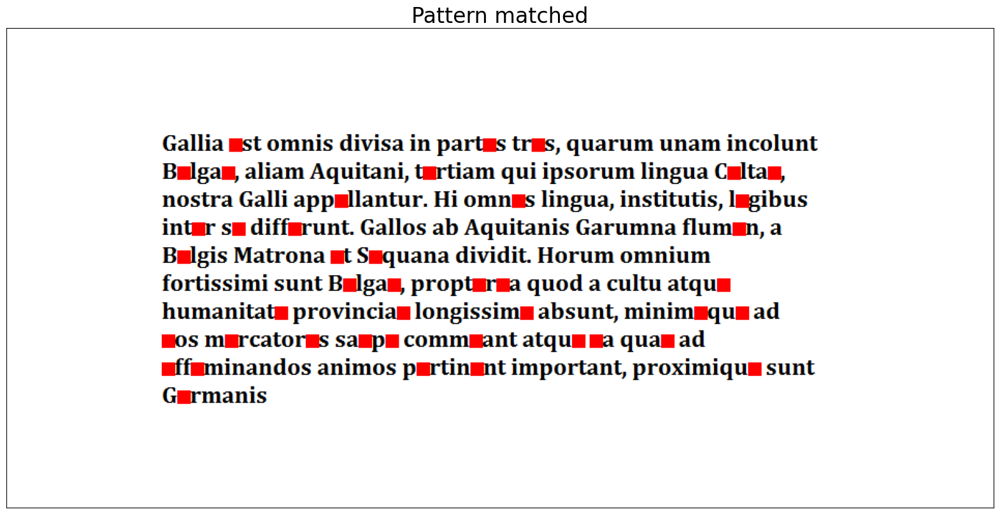

In [11]:
print(f"Occurences: {occurences}")
plt.figure(figsize=(20,20))

show_image(original,(1,1,1),"Pattern matched",False)

plt.show()

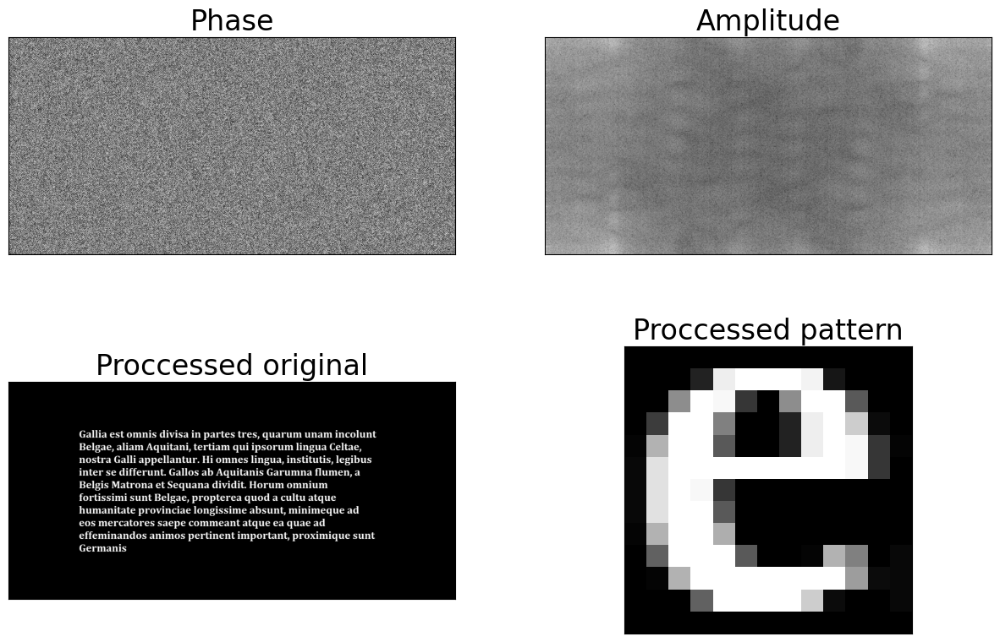

In [12]:
img = Image.open("galia.png")
original,original_proccessed = preprocess_img(img)
img = Image.open("galia_e.png")
pattern,pattern_proccessed = preprocess_img(img)

dft = np.fft.fft2(original_proccessed)

phase = np.angle(dft)
amplitude = np.log(np.abs(dft))

plt.figure(figsize=(15,15))
plt.rcParams.update({'font.size': 20})
show_image(phase,(3,2,1),"Phase")
show_image(amplitude,(3,2,2),"Amplitude")
show_image(original_proccessed,(3,2,3),"Proccessed original")
show_image(pattern_proccessed,(3,2,4),"Proccessed pattern")
occurences = find_pattern(dft,pattern_proccessed,original,pattern.size,min_value=0.8)

plt.show()

Occurences: 467


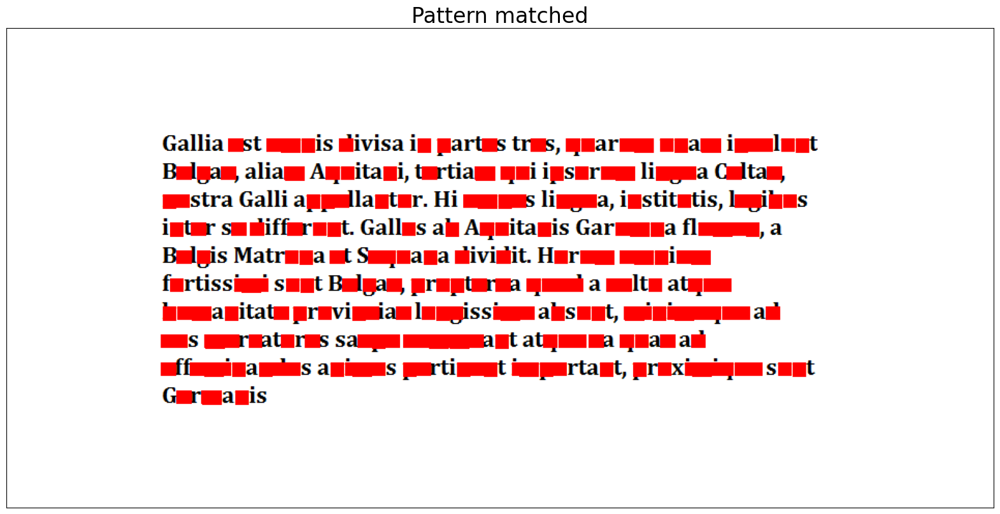

In [13]:
print(f"Occurences: {occurences}")
plt.figure(figsize=(20,20))

show_image(original,(1,1,1),"Pattern matched",False)

plt.show()

### Wnioski: 
Co do tekstu, mozna stwierdzić, ze bardzo dokładnie znajduje odpowiedni wzorzec, działa bardzo dobrze, mozna by było nawet ustawić 
wartość bardzo bliską 1 i wykryłoby wszystkie wystąpienia litery e

Co do ławicy ryb, niestety nie znajduje odpowiednich wzorców, cięzko jest tez znaleźć, gdyz te ryby nie są dokładnie takie same jak wzorzec,
w przypadku liter to działa, natomiast tu mamy bardzo duze zroznicowanie. Co prawda moznaby było zmieniac wartosc ```extraValue``` i bardziej je przez to kontrastować, aczkolwiek mimo to i tak ciezko byłoby je wszystkie znaleźć, podobnie zmieniając próg akceptacji zmienną ```min_value```

Dodatkowo te ryby są pod róznym kątem, zlewają się z tłem, bo są tego samego koloru, więc łatwiej o pomyłke co oznacza ze trudniej dopasować.

# 2. OCR

Napisz program przekształacający obraz w tekst, przyjmując następujące założenia:
1.  Na obrazie znajduje się tekst złożony z małych liter alfabetu łacińskiego oraz cyfr
2.  Na obrazie występuje jeden typ i rozmiar czcionki
3.  Weź pod uwagę czcionki szeryfowe i bezszeryfowe
4.  W tekście występują znaki przestankowe: .,?!
5.  Tekst składa się z wielu linii
6.  Tekst może być obrócony (krzywo zeskanowany w całości)
7.  Program powinien zwracać tekst wraz ze znakami białymi i znakami nowych linii
8.  Program może raportować procent poprawnie rozpoznanych liter dla pre-definiowanychobrazów testowyc
9.  Program powinien dodatkowo zliczać liczbę wystąpień każdej litery
10.  Należy zastosować operację splotu i DFT albo inne metody (klasyfikacja)
11.  Należy dokonać redukcji szumu na obrazie wejściowym

In [434]:
DATA_DIR = "ocr"
FONT_DIR = "fonts"
TXT_DIR = "txt"
CINZEL = os.path.join(FONT_DIR, "cinzel.ttf")
OPENSANS = os.path.join(FONT_DIR, "opensans.ttf")
GOT = os.path.join(FONT_DIR, "GoT.ttf")
ARIAL = os.path.join(FONT_DIR, "arial.ttf")
HP = os.path.join(FONT_DIR, "hp.ttf")
GOT_PATH = os.path.join(TXT_DIR, "got.txt")
PI_PATH = os.path.join(TXT_DIR, "text_numbers.txt")

def generate_image_from_text(textfile, name, fontfile, line_spacing=1.2,dest_dir=DATA_DIR):
    # Load the text from the file
    with open(textfile, 'r') as file:
        lines = file.readlines()

    # Set the font properties
    font_size = 24
    font = ImageFont.truetype(fontfile, font_size)

    # Calculate the size of the image based on the text length and font size
    text_widths = [font.getbbox(line.strip())[2] for line in lines]
    max_width = max(text_widths)
    image_width = max_width + 20
    line_height = int(font_size * line_spacing) 
    image_height = line_height * len(lines) + 20

    # Create a blank image with a white background
    image = Image.new('RGB', (image_width, image_height), 'white')
    draw = ImageDraw.Draw(image)

    # Set the text color to black
    text_color = (0, 0, 0)

    # Calculate the starting position to center the text vertically
    y = (image_height - line_height * len(lines)) // 2

    # Draw each line of text on the image
    for line, width in zip(lines, text_widths):
        line = line.strip()  # Remove leading/trailing whitespace
        x = (image_width - width) // 2
        draw.text((x, y), line, font=font, fill=text_color)
        y += line_height

    # Save the image to the data folder
    font_name = os.path.splitext(os.path.basename(fontfile))[0]
    image_path = os.path.join(dest_dir, f'{name}_{font_name}.png')
    image.save(image_path)
    return image_path
    
image_opensans = generate_image_from_text(GOT_PATH, 'got', OPENSANS)
image_cinzel = generate_image_from_text(GOT_PATH, 'got', CINZEL)
image_got = generate_image_from_text(GOT_PATH, 'got', GOT,line_spacing=1.5)
image_arial = generate_image_from_text(GOT_PATH, 'got', ARIAL)
image_hp = generate_image_from_text(GOT_PATH, 'got', HP)
image_pi_cinzel = generate_image_from_text(PI_PATH, 'pi', CINZEL)
image_pi_opensans = generate_image_from_text(PI_PATH, 'pi', OPENSANS)


In [500]:
# import pytesseract

chars = "abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.,?!"

def generate_character_image(character, font, font_size=24):
    image = Image.new('RGB', (2*font_size, 2*font_size), 'white')
    draw = ImageDraw.Draw(image)

    padding = 1
    draw.text((padding,padding), character, font=font, fill=(0, 0, 0))
    bbox = draw.textbbox((padding,padding), character, font=font)
    bbox = (bbox[0]-padding, bbox[1]-padding - 2, bbox[2] + padding, bbox[3] + padding + 2)
    image = image.crop(bbox)

    return image

def get_text(chars_positions, shapes_of_chars):
    text = ""
    for y in sorted(chars_positions.keys()):
        prev_char_size = None
        for x in sorted(chars_positions[y].keys()):
            char = chars_positions[y][x]
            if prev_char_size and char[1] - prev_char_size >= 4:
                text += " "
            text += char[0]
            prev_char_size = char[1] + shapes_of_chars[char[0]][0]
        text += "\n"
    return text
    
def ocr(image_path,font_path,min_value=0.95,eps=1e-6):
    img = Image.open(image_path)
    img_width,img_height = img.size

    original,img_proccessed = preprocess_img(img)
    font = ImageFont.truetype(font_path, 24)
    

    dft = np.fft.fft2(img_proccessed)

    found_chars = list()
    shapes_of_chars = dict()
    original_accessor = original.load()
    diff_r, diff_g, diff_b = (0,-255,-255)
    char_counter = dict()
    for char in chars:
        char_width, char_height = font.getbbox(char)[2], font.getbbox(char)[3]
        shapes_of_chars[char] = (char_width, char_height)
        letter = Image.new('RGB', (char_width, char_height), color='white')
        ImageDraw.Draw(letter).text((0, 0), char, font=font, fill='black')
        _, letter_processed = preprocess_img(letter)


        # adjusting size
        # letter = generate_character_image(char,font)
        # char_width,char_height = letter.size
        # shapes_of_chars[char] = (char_width,char_height)
        # _,letter_processed = preprocess_img(letter)
        # adjusting size

        # show_image(letter_processed,(1,1,1),"Proccessed letter")
        
        # original = Image.open(image_path)
        # C = np.real(np.fft.ifft2(np.multiply(dft, np.fft.fft2(np.rot90(letter_processed, 2), s=img_proccessed.shape))))
        # C_min = np.max(C) * min_value
        # original_accessor = original.load()
        # for x,y in np.argwhere(C > C_min):
        #     found_chars.append((char,x-char_width,y-char_height,C[x][y]))
        #     for w in range(char_width):
        #         for h in range(char_height):
        #             original_accessor[x-w, y-h] = (255,0,0)

        # stała normalizująca
        max_letter_C = np.max(np.real(np.fft.ifft2(np.fft.fft2(letter_processed) * np.fft.fft2(np.rot90(letter_processed, k=2)))))
        # wyliczanie C dla każdego piksela oraz normalizacja
        C = np.abs(np.real(np.fft.ifft2(dft * np.fft.fft2(np.rot90(letter_processed, k=2), s=[img_width, img_height])) / max_letter_C - 1))

        
        for x in range(img_width):
            for y in range(img_height):
                if C[x][y] < eps:
                    found_chars.append((char, x - char_width + 1, y - char_height + 1, C[x][y]))
                    char_counter[char] = char_counter.get(char,0) + 1
                    for w in range(char_width):
                        for h in range(char_height):
                            r, g, b = original_accessor[x-w, y-h]
                            original_accessor[x-w, y-h] = (r+diff_r, g+diff_g, b+diff_b)
    show_image(original,(1,1,1),"Proccessed original",False)

    chars_positions = defaultdict(dict)
    char_width = font.getbbox(".")[2]
    char_height = font.getbbox(".")[3]
    
    for char in found_chars:
        x = char[1] // char_width
        y = char[2] // char_height
        if y not in chars_positions or x not in chars_positions[y] or char[3] < chars_positions[y][x][3]:
            chars_positions[y][x] = char

    return get_text(chars_positions, shapes_of_chars),char_counter


Odległość levenshteina:

In [501]:
def get_matrix_distance(word1,word2,val = 0):
    word1,word2 = word2,word1
    n = len(word1)
    m = len(word2)
    matrix = [[0 for _ in range(n+1)] for _ in range(m+1)]

    for i in range(n+1):
        matrix[0][i] = i
    for i in range(m+1):
        matrix[i][0] = i

    for i in range(1,m+1):
        for j in range(1,n+1):
            if(word1[j-1] == word2[i-1]):
                matrix[i][j] = matrix[i-1][j-1]
            else:
                matrix[i][j] = 1 + min(matrix[i-1][j-1] + val,matrix[i-1][j],matrix[i][j-1])
    return matrix[m][n]
def string_similarity(s1, s2):
    # Calculate the Levenshtein distance
    distance = get_matrix_distance(s1, s2)
    
    # Calculate the similarity in percentage
    max_length = max(len(s1), len(s2))
    similarity = 100 * (1 - distance / max_length)
    
    return similarity

### Szeryfowe

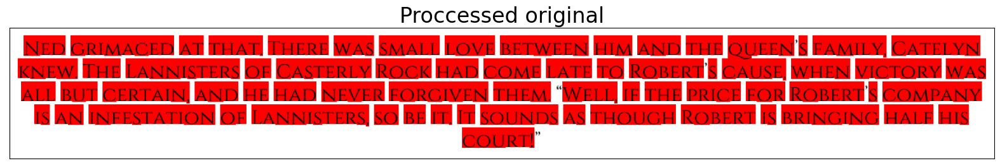

Ned grimaced at that. There was small love between him and the queen s family, Catelyn
knew. The Lannisters of Casterly Rock had come late to Robert s cause, when victory was
all but certain, and he had never forgiven them. Well, if the price for Robert s company
is an infestation of Lannisters, so be it. It sounds as though Robert is bringing half his
court!

Similarity: 98.62258953168043%


In [502]:
plt.figure(figsize=(20,20))
text = ocr(image_cinzel,CINZEL,eps=1e-4)
img = Image.open(image_cinzel)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(GOT_PATH,'r').read())}%")

<AxesSubplot: >

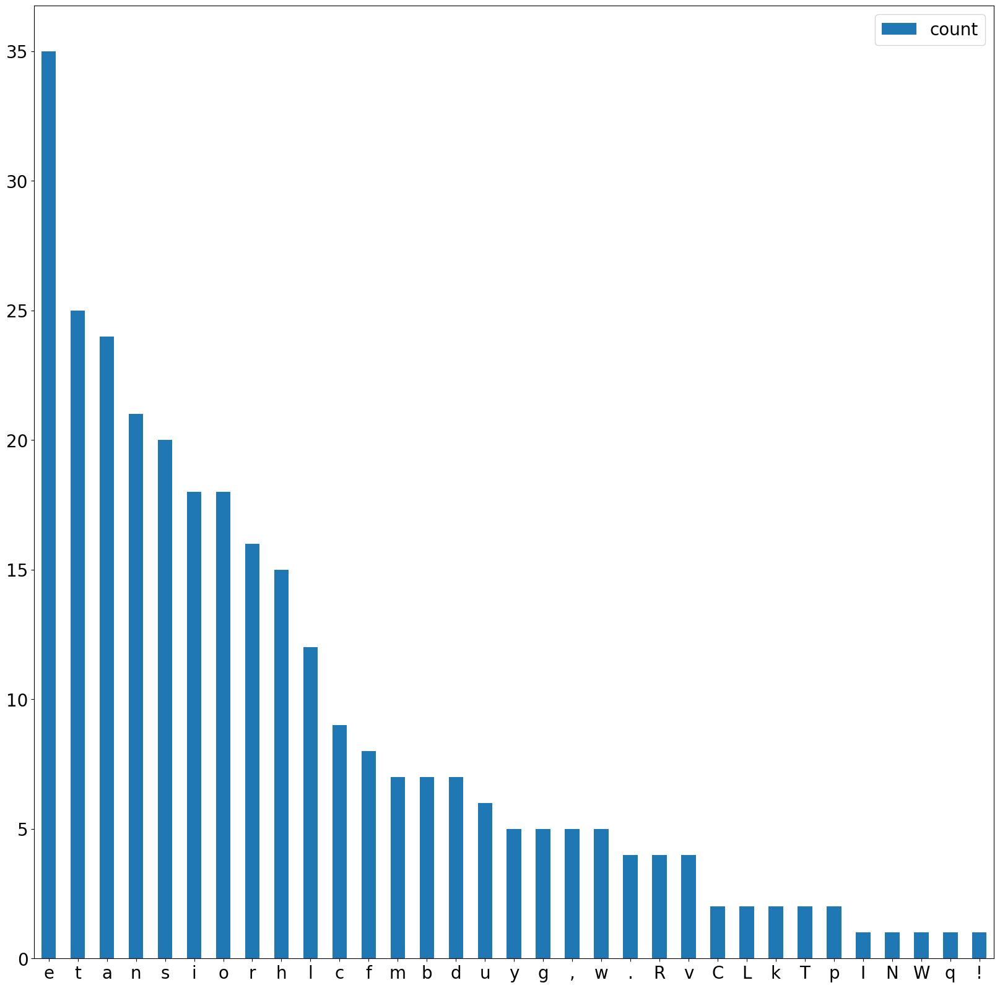

In [503]:
data_frame = pd.DataFrame.from_dict(text[1],orient='index',columns=['count'])
data_frame.sort_values(by=['count'],ascending=False,inplace=True)
data_frame.plot.bar(figsize=(20,20), rot=0)

### Nie Szeryfowe

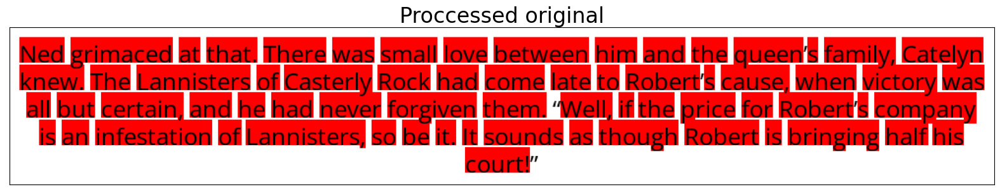

Ned grimaced at that. There was small love between him and the queen s family, Catelyn
knew. The Lannisters of Casterly Rock had come late to Robert s cause, when victory was
all but certain, and he had never forgiven them. Well, if the price for Robert s company
is an infestation of Lannisters, so be it. It sounds as though Robert is bringing half his
court.

Similarity: 98.34710743801654%


In [504]:
plt.figure(figsize=(20,20))
text = ocr(image_opensans,OPENSANS)
img = Image.open(image_opensans)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(GOT_PATH,'r').read())}%")

<AxesSubplot: >

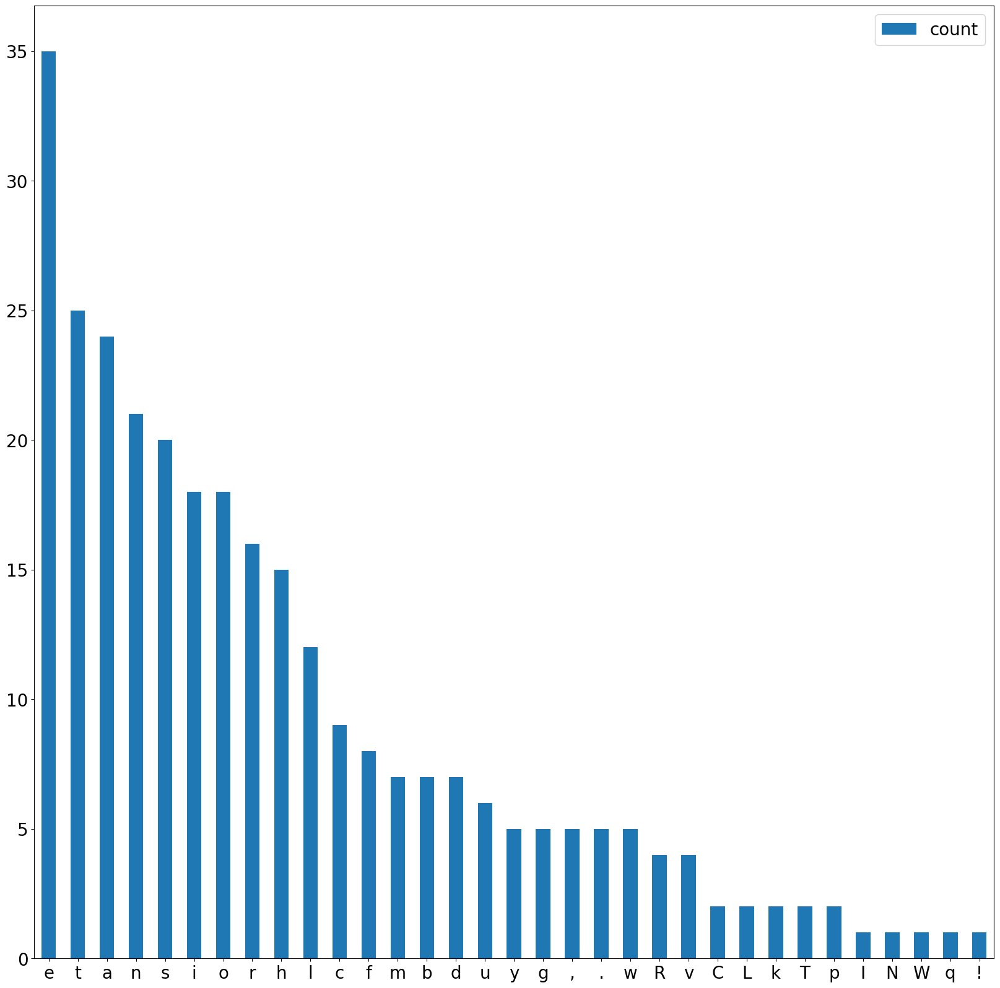

In [505]:
data_frame = pd.DataFrame.from_dict(text[1],orient='index',columns=['count'])
data_frame.sort_values(by=['count'],ascending=False,inplace=True)
data_frame.plot.bar(figsize=(20,20), rot=0)

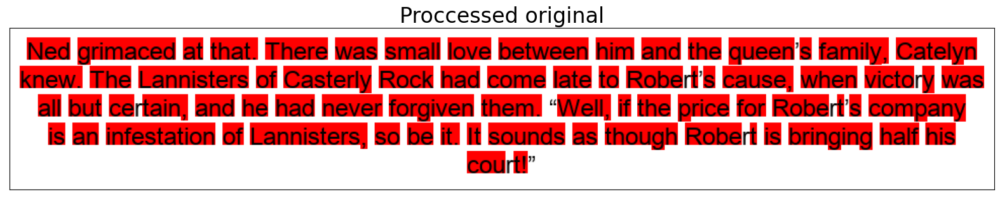

Ned grimaced at that. There was small love between him and the queen s family, Catel n
knew. The Lannisters of Casterly Rock had come late to Robe t s cause, when vi to y was
all but ce tain, and he had never forgiven them. Well if the pr ce for Robe t s company
is an infestation of Lannisters, so be it. It sounds as though Robe t is bring ng half his
cou t!

Similarity: 95.59228650137742%


In [433]:
plt.figure(figsize=(20,20))
text = ocr(image_arial,ARIAL,eps=1e-5)
img = Image.open(image_arial)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(GOT_PATH,'r').read())}%")

### Inne

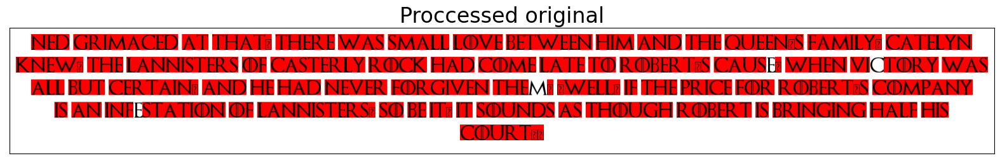

ned grimaced at that0 there was small love between h m and the queen0s fami y0 catelyn
knew0 the lann sters of casterly rock had come late to robert0s caus 0 when vi tory was
all but certain0 and he had never forgi en the 0 0well0 if the pri e for robert0s company
s an nf station of lannisters0 so be it0 it sounds as though robert s bringi g half his
court00

Similarity: 88.4297520661157%


In [427]:
plt.figure(figsize=(20,20))
text = ocr(image_got,GOT,eps=1e-4)
img = Image.open(image_got)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(GOT_PATH,'r').read())}%")

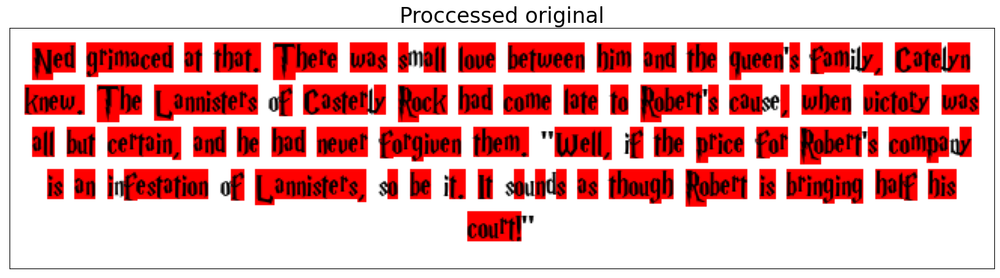

Ned grimaced at that There was s al love between him and he queen s fam y, Cate yn
knew. The Lannisters f Caster y Rock had come late to Robert s cau , when victory was
all but certai , and he had never forgiven them. Well f the price for Robert s compa y
i an i festati n f Lannisters, o be t. It o n s as though Robert s br nging half h s
court!

Similarity: 91.18457300275482%


In [437]:
plt.figure(figsize=(20,20))
text = ocr(image_hp,HP,eps=1e-5)
img = Image.open(image_hp)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(GOT_PATH,'r').read())}%")

### Dodatkowo sprawdzam na innym tekście tym razem z liczbami



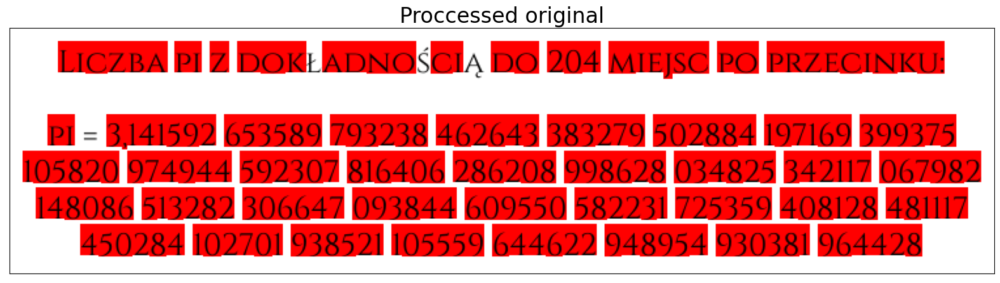

Liczba pi z dok adno ci do 204 miejsc po przecinku.
pi 3,141592 653589 793238 462643 383279 502884 197169 399375
105820 974944 592307 816406 286208 998628 034825 342117 067982
148086 513282 306647 093844 609550 582231 725359 408128 481117
450284 102701 938521 105559 644622 948954 930381 964428

Similarity: 96.3455149501661%


In [440]:
plt.figure(figsize=(20,20))
text = ocr(image_pi_cinzel,CINZEL,eps=1e-5)
img = Image.open(image_pi_cinzel)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(PI_PATH,'r').read())}%")

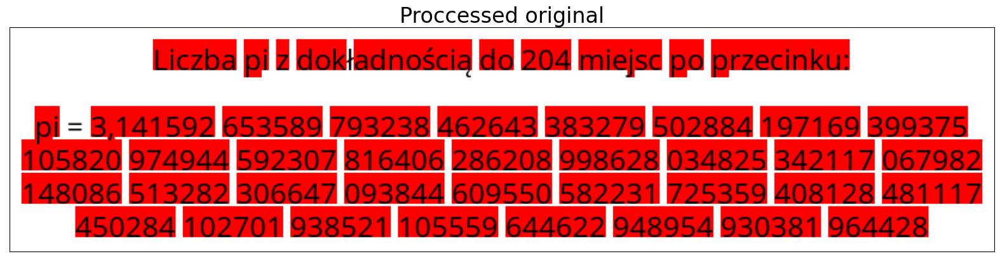

Liczba pi z dok adnoscia do 204 miejsc po przecinku.
pi 3,141592 653589 793238 462643 383279 502884 197169 399375
105820 974944 592307 816406 286208 998628 034825 342117 067982
148086 513282 306647 093844 609550 582231 725359 408128 481117
450284 102701 938521 105559 644622 948954 930381 964428

Similarity: 96.3455149501661%


In [441]:
plt.figure(figsize=(20,20))
text = ocr(image_pi_opensans,OPENSANS)
img = Image.open(image_pi_opensans)
plt.show()
print(text[0])
print(f"Similarity: {string_similarity(text[0],open(PI_PATH,'r').read())}%")

### Wnioski:

Algorytm zdaje sie czasami mylić przykładowo '.' z '!' i czasami podmienia '!', aczkolwiek w wielu przypadkach wynik wychodzi dość podobnie,
czasami gubi niektóre znaki, próbowałem tez dodawać takie znaki jak := {',",()} i w tych przypadkach nawet kosztem innych znaków moze zgubić. 

Do badania podobienstwa z orginałem zastosowałem odległość levenshteina i wyniki wychodzą dość dobrze.
Pozwoliłem sobie dodać customowe czcionki takie jak "harry potter" są one dość róznorodne i bardziej pokrzywione, co ma wpływ na podobienstwo
bo najgorzej wypadła ta własnie czcionka

Duze znaczenie ma jaka wartosc do klasyfikacji wybierzemy (eps), bo w zalezności od niej, zaakwalifuje nam odpowiednie znaki, więc mozna 
nią manipulować.

Program nie wykrywa obrotów znaków, aczkolwiek pomysł mógłby być taki, ze mozna by było obracać kazdy znak i szukać najwiekszej korelacji z danym znakiem

Samo osiągnięcie 100% podobieństwa jest praktycznie niemozliwe przy losowych tekstach